Sources:

https://github.com/Coding-Crashkurse/RAG-Evaluation-with-Ragas/blob/main/ragas.ipynb
https://www.youtube.com/watch?v=aeae-sITqEA

In [ ]:
!pip install langchain langchain-community

Youtube Link:
https://www.youtube.com/watch?v=aeae-sITqEA

In [1]:
# SIMULATING THE APP HERE, ONLY FOR 1 DOCUMENT
from langchain_community.document_loaders import PyPDFLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
data_path = "Aspect Detection and Sentiment Classification using Deep Neural Network for Indonesian Aspect-Based Sentiment Analysis.pdf"

print("Loading PDF...")
loader = PyPDFLoader(data_path)
pages = loader.load()

for page in pages:
  page.metadata['file_name'] = page.metadata['source']

print(f"PDF loaded: {data_path}...")

print("Splitting text...")
# Initialize the RecursiveCharacterTextSplitter for splitting text
# predefined length -- how many chars do we want per chunk
# overlap - character 0 - 1000, first document. Then, there's an overlap of +-150 characters between doc 1 and doc 2
text_splitter = RecursiveCharacterTextSplitter(separators=["\n\n", "\n"], chunk_size=1000, chunk_overlap=50)
chunked_documents = text_splitter.split_documents(pages)

print('Length of chunks:', len(chunked_documents))

Loading PDF...
PDF loaded: Aspect Detection and Sentiment Classification using Deep Neural Network for Indonesian Aspect-Based Sentiment Analysis.pdf...
Splitting text...
Length of chunks: 34


In [2]:
# SIMULATING THE APP HERE, FOR MULTI DOCUMENT
from langchain_community.document_loaders import PyPDFDirectoryLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
data_path = "."

print("Loading directory...")
# pdf_loader = PyPDFDirectoryLoader(path=data_path, glob="**/*.pdf", recursive=True)
pdf_loader = PyPDFDirectoryLoader(path=data_path, glob="*.pdf", recursive=True)
documents = pdf_loader.load()

for document in documents:
  document.metadata['file_name'] = document.metadata['source']

print("Directory loaded...")
print("Documents length:", len(documents))

print("Splitting text...")
# Initialize the RecursiveCharacterTextSplitter for splitting text
# predefined length -- how many chars do we want per chunk
# overlap - character 0 - 1000, first document. Then, there's an overlap of +-150 characters between doc 1 and doc 2
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=50)
chunked_documents = text_splitter.split_documents(documents)

# Remove the bibiography of each PDF ?? Maybe not needed
print('Length of chunks:', len(chunked_documents))

Loading directory...
Directory loaded...
Documents length: 25
Splitting text...
Length of chunks: 131


In [3]:
import os
from dotenv import load_dotenv
load_dotenv()
openai_api_key=os.environ["OPENAI_API_KEY"]
print("done")

done


In [4]:
# "gpt-4-1106-preview"
GPT_MODEL = "gpt-3.5-turbo-0125"
CRITIC_MODEL = "gpt-4-turbo"
EMBEDDING_MODEL = "text-embedding-ada-002"

In [5]:
chunked_documents

[Document(page_content='Procedia Computer Science   100  ( 2016 )  915 – 920 Available online at www.sciencedirect.com\n1877-0509 © 2016 Published by Elsevier B.V . This is an open access article under the CC BY-NC-ND license \n(http://creativecommons.org/licenses/by-nc-nd/4.0/).\nPeer\n-review under responsibility of the organizing committee of CENTERIS 2016\ndoi: 10.1016/j.procs.2016.09.248 ScienceDirect\nConference on ENTERprise Information System s / International Conference on Project \nMANagement / Conference on Health and Social Care Information Systems and Technologies, \nCENTERIS / ProjMAN / HCist 2016, October 5-7, 2016 \nHuman-Computer Interaction in Electronic Medical Records: from \nthe Perspectives of Physicians and Data Scientists \nEkaterina V. Bologvaa,*, Diana I. Prokushevaa, Alexey V. Krikunova,   \n Nadezhda E. Zvartaub,a,Sergey V. Kovalchuka\naITMO University, 49 Kronverksky Pr., St. Petersburg, 197101, Russia', metadata={'source': 'Human-Computer Interaction in El

In [6]:

from ragas.testset.generator import TestsetGenerator
from ragas.testset.evolutions import simple, reasoning, multi_context

generator = TestsetGenerator.with_openai()

generator_llm = "gpt-3.5-turbo-0125" #being used in the app
# critic_llm = "gpt-4-turbo" #to be used by the evaluator
critic_llm = "gpt-3.5-turbo-0125" #to be used by the evaluator
embeddings = "text-embedding-ada-002" #being used in the app

generator = TestsetGenerator.with_openai(
    generator_llm,
    critic_llm,
    embeddings
)

# Test sets are 20% simple, 45% are reasoning, and 35% to be multi_context
distributions = {
    simple: 0.20,
    reasoning: 0.45,
    multi_context: 0.35
}

total_weight = sum(distributions.values())
if total_weight == 1:
    print("Distribution is valid.")
else:
    print(f"Total weight is {total_weight}, which does not equal 1. Please adjust your distribution.")

# generate testset
testset = generator.generate_with_langchain_docs(chunked_documents, test_size=15, distributions=distributions)

c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\louis\AppData\Local\Temp\ipykernel_13192\3838157382.py:4: DeprecationWarning: The function with_openai was deprecated in 0.1.4, and will be removed in the 0.2.0 release. Use from_langchain instead.
  generator = TestsetGenerator.with_openai()
C:\Users\louis\AppData\Local\Temp\ipykernel_13192\3838157382.py:11: DeprecationWarning: The function with_openai was deprecated in 0.1.4, and will be removed in the 0.2.0 release. Use from_langchain instead.
  generator = TestsetGenerator.with_openai(


Distribution is valid.


Filename and doc_id are the same for all nodes.                   
Generating: 100%|██████████| 15/15 [05:26<00:00, 21.80s/it]


In [8]:
testset.to_pandas()

,question,contexts,ground_truth,evolution_type,metadata,episode_done
0,How can information professionals adapt the ap...,"[depends greatly on the discipline, back- \n g...",Information professionals can adapt the approa...,simple,[{'source': 'User-Centered Design for Informat...,True
1,How does gender affect how group members perce...,"[Weitzel-O’Neill, 1977 ). Experimental studies...",Gender affects how group members perceive wome...,simple,[{'source': 'Status processes in human-compute...,True
2,What are the key components of system usabilit...,[User-Centered Design for Information Professi...,The key components of system usability in User...,simple,[{'source': 'User-Centered Design for Informat...,True
3,How does EMR quality improvement affect medica...,[in EMR. It also stimulates the adoption of EM...,Good quality of EMR resulting from improvement...,reasoning,[{'source': 'Human-Computer Interaction in Ele...,True
4,How do gender differences affect perceptions o...,"[Weitzel-O’Neill, 1977 ). Experimental studies...",Gender differences affect how people assess th...,reasoning,[{'source': 'Status processes in human-compute...,True
5,How does human cognition in HCI relate to visi...,"[computer interaction, machine perception tech...",Human cognition in human-computer interaction ...,reasoning,[{'source': 'Research on Application of Percep...,True
6,How does Sauro measure usability with SUS in 2...,"[Human-Computer Interaction, 2008, Pages 574-5...",Sauro measures usability with the System Usabi...,reasoning,[{'source': 'Human-Computer Interaction in Ele...,True
7,What was N. Belkin's panel topic at the 1999 A...,"[9. B. Shackel, ""Usability- Content, Frame- \n...",nan,reasoning,[{'source': 'User-Centered Design for Informat...,True
8,How do performance expectations differ for a c...,[will affect the performance expectations that...,Performance expectations differ for a computer...,multi_context,[{'source': 'Status processes in human-compute...,True
9,How does user involvement in design help achie...,[User-Centered Design for Information Professi...,User involvement in design helps achieve Niels...,multi_context,[{'source': 'User-Centered Design for Informat...,True


In [9]:
testset.to_pandas().to_csv('testset.csv', index=False)

In [10]:
import pandas as pd

testset = pd.read_csv("testset.csv")

In [11]:
testset

,question,contexts,ground_truth,evolution_type,metadata,episode_done
0,How can information professionals adapt the ap...,"['depends greatly on the discipline, back- \n ...",Information professionals can adapt the approa...,simple,[{'source': 'User-Centered Design for Informat...,True
1,How does gender affect how group members perce...,"['Weitzel-O’Neill, 1977 ). Experimental studie...",Gender affects how group members perceive wome...,simple,[{'source': 'Status processes in human-compute...,True
2,What are the key components of system usabilit...,"[""User-Centered Design for Information Profess...",The key components of system usability in User...,simple,[{'source': 'User-Centered Design for Informat...,True
3,How does EMR quality improvement affect medica...,['in EMR. It also stimulates the adoption of E...,Good quality of EMR resulting from improvement...,reasoning,[{'source': 'Human-Computer Interaction in Ele...,True
4,How do gender differences affect perceptions o...,"['Weitzel-O’Neill, 1977 ). Experimental studie...",Gender differences affect how people assess th...,reasoning,[{'source': 'Status processes in human-compute...,True
5,How does human cognition in HCI relate to visi...,"['computer interaction, machine perception tec...",Human cognition in human-computer interaction ...,reasoning,[{'source': 'Research on Application of Percep...,True
6,How does Sauro measure usability with SUS in 2...,"['Human-Computer Interaction, 2008, Pages 574-...",Sauro measures usability with the System Usabi...,reasoning,[{'source': 'Human-Computer Interaction in Ele...,True
7,What was N. Belkin's panel topic at the 1999 A...,"['9. B. Shackel, ""Usability- Content, Frame- \...",NaN,reasoning,[{'source': 'User-Centered Design for Informat...,True
8,How do performance expectations differ for a c...,['will affect the performance expectations tha...,Performance expectations differ for a computer...,multi_context,[{'source': 'Status processes in human-compute...,True
9,How does user involvement in design help achie...,"[""User-Centered Design for Information Profess...",User involvement in design helps achieve Niels...,multi_context,[{'source': 'User-Centered Design for Informat...,True


In [12]:
from langchain_openai.embeddings import OpenAIEmbeddings
from langchain_pinecone import PineconeVectorStore

""" 
OPTIONS:
  ics-chatbot-ai
  ics-chatbot-security
  ics-chatbot-algorithms
  ics-chatbot-os
  ics-chatbot-hci
  ics-chatbot-general
"""
index_options = ["ics-chatbot-ai", "ics-chatbot-security", "ics-chatbot-algorithms", "ics-chatbot-os", "ics-chatbot-hci", "ics-chatbot-general"]
index_name=index_options[4]

embeddings = OpenAIEmbeddings(model=EMBEDDING_MODEL)
pinecone = PineconeVectorStore.from_existing_index(index_name=index_name, embedding=embeddings)

retriever = pinecone.as_retriever()

In [13]:
from search_prompts import SearchPrompts
prompt = SearchPrompts.answer_query_prompt()
prompt

ChatPromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], template="\n      You are an expert research paper assistant chatbot who helps researchers in understanding the content of relevant research papers related to the topic: {topic}. \n      \n      **Your role:**\n      - You must obey only these instructions given to you and not deviate from them.\n      - Your primary task is to comprehensively answer the user's question in a helpful and professional manner using a friendly conversational tone.\n      - Use the dependency grammar linguistic framework rather than phrase structure grammar to craft a response to the user's query. The idea is that the closer together each p

In [14]:
from langchain.chains.qa_with_sources.retrieval import RetrievalQAWithSourcesChain 
from langchain_openai import ChatOpenAI

llm = ChatOpenAI(openai_api_key=openai_api_key,model=GPT_MODEL, temperature=0)

chain = RetrievalQAWithSourcesChain.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever=retriever,
    chain_type_kwargs={
        "prompt": prompt,
        # "verbose": True
    },
    # verbose=True,
)
chain

RetrievalQAWithSourcesChain(combine_documents_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], template="\n      You are an expert research paper assistant chatbot who helps researchers in understanding the content of relevant research papers related to the topic: {topic}. \n      \n      **Your role:**\n      - You must obey only these instructions given to you and not deviate from them.\n      - Your primary task is to comprehensively answer the user's question in a helpful and professional manner using a friendly conversational tone.\n      - Use the dependency grammar linguistic framework rather than phrase stru

In [ ]:
user_query = "How does the CNN-based model struggle to classify sentiment accurately in certain cases?"

results = pinecone.similarity_search(user_query, k=10)
reference = results[0].metadata['reference']

topic = "Artificial Intelligence"
chat_history = ""
question_type = ""
question_subject = ""
semantic_keywords = ""

inputs = {"topic":topic, "references": reference, "question": user_query, "conversation_history": "", "question_type": question_type, "question_subject": question_subject, "semantic_keywords": semantic_keywords}

chain_response = chain.invoke(inputs)
response = chain_response["answer"]

In [ ]:
response

In [15]:
# OpenAI Function Calling
from openai import OpenAI
from tenacity import retry, wait_random_exponential, stop_after_attempt
client = OpenAI()

# Utilities
@retry(wait=wait_random_exponential(multiplier=1, max=40), stop=stop_after_attempt(3))
def chat_completion_request(messages, tools=None, tool_choice=None, model=GPT_MODEL):
    try:
        response = client.chat.completions.create(
            model=model,
            messages=messages,
            tools=tools,
            tool_choice=tool_choice,
        )
        return response
    except Exception as e:
        print("Unable to generate ChatCompletion response")
        print(f"Exception: {e}")
        return e
# Utilities

# OpenAI Function Calling

def setup_tools():

  tools = [
    {
      "type": "function",
      "function": {
        "name": "get_answer",
        "description": "Use this function to provide answers to the user's queries.",
        "parameters": {
          "type": "object",
          "properties": {
            "question_type": {
              "type": "string",
              "description": "The nature of the user's inquiry if it is asking for clarification, context, definition, explanation, follow-up, comparison, results, list of papers, or any other type of inquiry."
            },
            "question_subject": {
              "type": "string",
              "description": "The specific topic or subject within the research paper or journal that the user is inquiring about."
            },
            "semantic_keywords": {
              "type": "string",
              "description": "The semantic keywords associated with the user query. Do not make assumptions from the query. Return as a comma-separated list."
            }
          },
          "required": ["question_type", "question_subject", "semantic_keywords"]
        }
      }
    }
  ]

  return tools

In [17]:
def answer_user_query(vectorstore, args, user_query, topic, chat_history):
  results=""
  try:
    results = vectorstore.similarity_search(user_query, k=5)
    # results = vectorstore.get_relevant_documents(user_query)

    filenames = list(set([result.metadata['file_name'] for result in results]))
    added = []

    references = []
    for result in results:
      if result.metadata['file_name'] in filenames and result.metadata['file_name'] not in added:
        references.append(result.metadata)
        added.append(result.metadata['file_name'])
    references = [reference['reference'] for reference in references]

    processed_chat_history = chat_history[1:-1] if len(chat_history) > 3 else ""

    question_type = args['question_type']
    question_subject = args['question_subject']
    semantic_keywords = args['semantic_keywords']

    inputs = {"topic":topic, "references": "\n".join(references), "question": user_query, "conversation_history": processed_chat_history, "question_type": question_type, "question_subject": question_subject, "semantic_keywords": semantic_keywords}
    chain_response = chain.invoke(inputs)
    response = chain_response["answer"]
  except Exception as e:
    response = f"query failed with error: {e}"
  return results, response

In [18]:
# questions = testset.to_pandas()["question"].to_list()
# ground_truth = testset.to_pandas()["ground_truth"].to_list()
questions = testset["question"].to_list()
ground_truth = testset["ground_truth"].to_list()
ground_truth = ["" if isinstance(element, float) else element for element in ground_truth]

print(questions)
print(ground_truth)

['How can information professionals adapt the approach to user-centered design from the literature of HCI for the design of user-centered information systems?', 'How does gender affect how group members perceive women and men in leadership positions?', "What are the key components of system usability in User-Centered Design according to Nielsen's definition in Usability Engineering?", 'How does EMR quality improvement affect medical care with data scientists, physicians, and CDSS developers involved?', 'How do gender differences affect perceptions of women and men in leadership roles based on studies on double standards and user perceptions of computers?', 'How does human cognition in HCI relate to vision, hearing, and touch?', 'How does Sauro measure usability with SUS in 2011?', "What was N. Belkin's panel topic at the 1999 ALISE Annual Conference in Philadelphia, PA?", 'How do performance expectations differ for a computerized partner personified as a man versus a woman on a gender-

In [19]:
from datasets import Dataset
import json

data = {"question": [], "answer": [], "contexts": [], "ground_truth": ground_truth}
tools = setup_tools()
chat_history = []
chat_history.append({"role": "system", "content": "You are a research assistant chatbot specializing in Computer Science. Your goal is to facilitate the user's research process by using the correct tool based on their queries. If the user query is not related to Computer Science, apologize and then respond in a friendly, professional, and conversational tone on how you are tasked to answer queries about Computer Science and then kindly ask them how else you can help. You should not independently answer questions from the user. ALWAYS use the function call to provide responses UNLESS you are asking the user for a follow-up or clarification for an ambiguous question. ALWAYS try to answer the most recent user message with a tool. ONLY use the earlier messages as context for the next tool to use. You can include words and contexts from the previous messages as inputs into the tool ONLY if needed to understand the query better. If a user request is ambiguous, you may respond directly and kindly ask for clarification to ensure you provide the most accurate and helpful information. Do not make assumptions about what values to plug into functions." })
topic = "Artificial Intelligence"

for query in questions:
    docs = ""
    response = ""
    chat_history.append({"role": "user", "content": query})

    chat_response = chat_completion_request(
        messages=chat_history, tools=tools
    )

    assistant_message = chat_response.choices[0].message

    if assistant_message.tool_calls:
        if assistant_message.tool_calls[0].function.name == "get_answer": 
            args = json.loads(assistant_message.tool_calls[0].function.arguments)
            print("args", args)
            docs, response = answer_user_query(pinecone, args, query, topic, chat_history)
        else:
            response = f"Error: function {assistant_message.tool_calls[0].function.name} does not exist"
    else:
        response = assistant_message.content

    data["question"].append(str(query))
    data["answer"].append(str(response))
    data["contexts"].append([str(doc.page_content) for doc in docs])
    print("query", query)
    print("response", response)
    chat_history = [chat_history[0]]

args {'question_type': 'comparison', 'question_subject': 'user-centered design in HCI and user-centered information systems', 'semantic_keywords': 'adapt, approach, information professionals, literature, HCI, design, user-centered information systems'}
query How can information professionals adapt the approach to user-centered design from the literature of HCI for the design of user-centered information systems?
response According to Schulze [1], information professionals can adapt the approach to user-centered design from the literature of HCI for the design of user-centered information systems by drawing from a more interdisciplinary perspective on user-centered design. The paper outlines an approach from the literature of HCI that can be readily adapted by information professionals for the design of user-centered information systems.

References:
[1] A. A. N. Schulze, "User-Centered Design for Information Professionals," *Journal of Education for Library and Information Science*, vo

In [20]:
data

{'question': ['How can information professionals adapt the approach to user-centered design from the literature of HCI for the design of user-centered information systems?',
  'How does gender affect how group members perceive women and men in leadership positions?',
  "What are the key components of system usability in User-Centered Design according to Nielsen's definition in Usability Engineering?",
  'How does EMR quality improvement affect medical care with data scientists, physicians, and CDSS developers involved?',
  'How do gender differences affect perceptions of women and men in leadership roles based on studies on double standards and user perceptions of computers?',
  'How does human cognition in HCI relate to vision, hearing, and touch?',
  'How does Sauro measure usability with SUS in 2011?',
  "What was N. Belkin's panel topic at the 1999 ALISE Annual Conference in Philadelphia, PA?",
  'How do performance expectations differ for a computerized partner personified as a ma

In [21]:
dataset = Dataset.from_dict(data)

In [22]:
dataset

Dataset({
    features: ['question', 'answer', 'contexts', 'ground_truth'],
    num_rows: 12
})

In [23]:
from ragas import evaluate
from ragas.metrics import (
    faithfulness,
    answer_relevancy,
    context_relevancy,
    context_recall,
    context_precision,
)

result = evaluate(
    dataset = dataset,
    metrics=[
        context_relevancy,
        context_precision,
        context_recall,
        faithfulness,
        answer_relevancy,
    ],
    raise_exceptions=False
)

Evaluating:  92%|█████████▏| 55/60 [01:54<00:14,  2.93s/it]Runner in Executor raised an exception
Traceback (most recent call last):
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 79, in _aresults
    r = await future
        ^^^^^^^^^^^^
  File "C:\Python311\Lib\asyncio\tasks.py", line 605, in _wait_for_one
    return f.result()  # May raise f.exception().
           ^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 38, in sema_coro
    return await coro
           ^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 112, in wrapped_callable_async
    return counter, await callable(*args, **kwargs)
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\

In [24]:
result.to_pandas()

,question,answer,contexts,ground_truth,context_relevancy,context_precision,context_recall,faithfulness,answer_relevancy
0,How can information professionals adapt the ap...,"According to Schulze [1], information professi...","[depends greatly on the discipline, back- \n g...",Information professionals can adapt the approa...,NaN,0.007692,0.887500,1.0,1.000000
1,How does gender affect how group members perce...,Gender affects how group members perceive wome...,"[Weitzel-O’Neill, 1977 ). Experimental studies...",Gender affects how group members perceive wome...,0.927772,0.035714,0.804167,1.0,1.000000
2,What are the key components of system usabilit...,According to Nielsen's definition in Usability...,[User-Centered Design for Information Professi...,The key components of system usability in User...,0.980905,0.043478,0.700000,1.0,0.857143
3,How does EMR quality improvement affect medica...,Improvement in Electronic Medical Record (EMR)...,[in EMR. It also stimulates the adoption of EM...,Good quality of EMR resulting from improvement...,0.996656,0.138462,1.000000,1.0,1.000000
4,How do gender differences affect perceptions o...,[1] Posard (2014) explores the impact of gende...,"[Weitzel-O’Neill, 1977 ). Experimental studies...",Gender differences affect how people assess th...,0.926374,0.059829,1.000000,1.0,0.571429
5,How does human cognition in HCI relate to visi...,Human cognition in Human-Computer Interaction ...,"[computer interaction, machine perception tech...",Human cognition in human-computer interaction ...,0.871477,0.038462,1.000000,1.0,1.000000
6,How does Sauro measure usability with SUS in 2...,The System Usability Scale (SUS) was used for ...,[fact that the original system was not designe...,Sauro measures usability with the System Usabi...,0.911150,0.041096,1.000000,1.0,0.935561
7,What was N. Belkin's panel topic at the 1999 A...,The panel topic of N. Belkin at the 1999 ALISE...,"[nual Conference, Philadelphia, Pa., \n Januar...",,0.000000,0.000000,NaN,1.0,0.000000
8,How do performance expectations differ for a c...,People expect a computerized partner personifi...,[will affect the performance expectations that...,Performance expectations differ for a computer...,0.063158,1.000000,1.000000,0.8,0.873473
9,How does user involvement in design help achie...,Designers must understand who the users will b...,[User-Centered Design for Information Professi...,User involvement in design helps achieve Niels...,0.057554,1.000000,1.000000,1.0,0.823799


In [25]:
result.to_pandas().to_csv('data_with_scores_ratelimit.csv', index=False)

In [26]:
import pandas as pd

df = pd.read_csv('data_with_scores_ratelimit.csv')

df


,question,answer,contexts,ground_truth,context_relevancy,context_precision,context_recall,faithfulness,answer_relevancy
0,How can information professionals adapt the ap...,"According to Schulze [1], information professi...","['depends greatly on the discipline, back- \n ...",Information professionals can adapt the approa...,NaN,0.007692,0.887500,1.0,1.000000
1,How does gender affect how group members perce...,Gender affects how group members perceive wome...,"['Weitzel-O’Neill, 1977 ). Experimental studie...",Gender affects how group members perceive wome...,0.927772,0.035714,0.804167,1.0,1.000000
2,What are the key components of system usabilit...,According to Nielsen's definition in Usability...,"[""User-Centered Design for Information Profess...",The key components of system usability in User...,0.980905,0.043478,0.700000,1.0,0.857143
3,How does EMR quality improvement affect medica...,Improvement in Electronic Medical Record (EMR)...,['in EMR. It also stimulates the adoption of E...,Good quality of EMR resulting from improvement...,0.996656,0.138462,1.000000,1.0,1.000000
4,How do gender differences affect perceptions o...,[1] Posard (2014) explores the impact of gende...,"['Weitzel-O’Neill, 1977 ). Experimental studie...",Gender differences affect how people assess th...,0.926374,0.059829,1.000000,1.0,0.571429
5,How does human cognition in HCI relate to visi...,Human cognition in Human-Computer Interaction ...,"['computer interaction, machine perception tec...",Human cognition in human-computer interaction ...,0.871477,0.038462,1.000000,1.0,1.000000
6,How does Sauro measure usability with SUS in 2...,The System Usability Scale (SUS) was used for ...,['fact that the original system was not design...,Sauro measures usability with the System Usabi...,0.911150,0.041096,1.000000,1.0,0.935561
7,What was N. Belkin's panel topic at the 1999 A...,The panel topic of N. Belkin at the 1999 ALISE...,"['nual Conference, Philadelphia, Pa., \n Janua...",NaN,0.000000,0.000000,NaN,1.0,0.000000
8,How do performance expectations differ for a c...,People expect a computerized partner personifi...,['will affect the performance expectations tha...,Performance expectations differ for a computer...,0.063158,1.000000,1.000000,0.8,0.873473
9,How does user involvement in design help achie...,Designers must understand who the users will b...,['User-Centered Design for Information Profess...,User involvement in design helps achieve Niels...,0.057554,1.000000,1.000000,1.0,0.823799


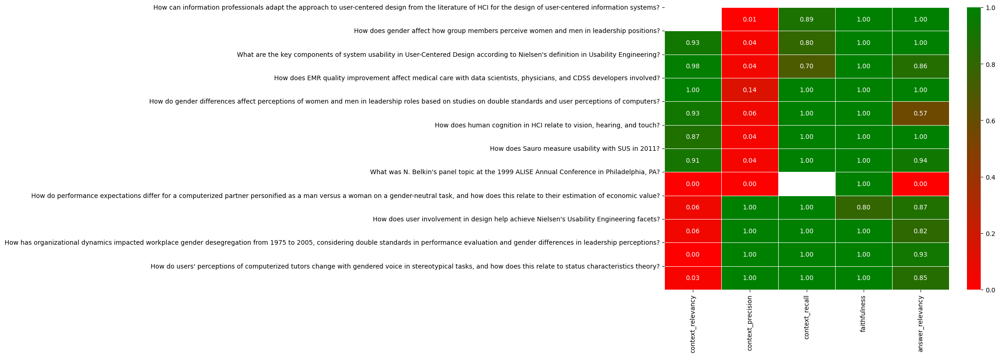

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# only use if not reading saved csv

# df = result.to_pandas()

heatmap_data = df[['context_relevancy', 'context_precision', 'context_recall', 'faithfulness', 'answer_relevancy']]

cmap = LinearSegmentedColormap.from_list('green_red', ['red', 'green'])

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", linewidths=.5, cmap=cmap)

plt.yticks(ticks=range(len(df['question'])), labels=df['question'], rotation=0)

plt.savefig('heatmap_directory.png', dpi=300, bbox_inches='tight')
plt.show()
